# Step 3 — Inverse Registration (MNI → Native)

Warps a MNI-space mask into subject-native T1 space using ANTs or a pre-computed
fmriprep warp, then computes a target coordinate (centre of mass or functional
peak) for TUS/TMS targeting.  Optionally, a second ROI mask can be combined with
the primary mask via logical union (`ROI_UNION_FILE`) before the target coordinate
is derived.

**Typical interaction time:** 30–45 min per session.

[← Step 2 — Mask preparation](step02_prepare_masks.ipynb) &nbsp;|&nbsp; **Step 3** &nbsp;|&nbsp; [Step 4 — PlanTUS →](step04_planTUS.ipynb)


In [12]:
# Reference card — displays the pipeline overview and all option tables.
# Run this cell once to see settings options before editing the Settings cell below.
exec(open(__import__('pathlib').Path(__vsc_ipynb_file__).parent / 'z_references/step3_reference.py').read())

Variable,What it is
REGISTRATION_MODE,"Registration engine. Run ANTs from scratch, or reuse a pre-computed warp from fmriprep."
INTENSITY_NORM ANTs only,How to normalise the MNI template intensity before registration. Affects convergence at different field strengths.
REGISTRATION_TYPE ANTs only,Deformable transform type. Single-step SyN or two-step Affine + SyNCC.
TARGET_MODE,How to derive the TUS target coordinate from the warped native mask.
FMRIPREP_WARP fmriprep only,Path to the pre-computed MNI→T1w composite warp (*_xfm.h5) from fmriprep.
ROI_UNION_FILE untested,"Optional second MNI-space mask. Warped to native space and combined with MASK_FILE via logical OR. When set, all target-coordinate modes operate on the combined mask. Leave empty to use MASK_FILE alone.⚠ This feature has not been validated on real data. Verify the combined mask visually before using the resulting coordinate."
ROI_UNION_LABEL untested,Short label for the ROI union mask; used in output filenames and figure titles (e.g. {MASK_LABEL}_union_{ROI_UNION_LABEL}_native.nii.gz).
LR_SPLIT,"When True, splits the warped native mask into left and right hemispheres using a pre-built hemisphere map (MNI_hemispheres_BN_1mm.nii.gz). Saves _L.nii.gz / _R.nii.gz and reports per-hemisphere CoM in Step 3e. Works for any MASK_FILE."
Setting,Behaviour
LR_SPLIT = False default,No hemisphere split. Only the bilateral native mask is saved.


In [13]:
# -----------------------------------------------------------------------
# Settings — edit here before running
# -----------------------------------------------------------------------

SITE_YAML  = "../config/sites/site_UMD_AK.yaml"
SUB_ID     = "sub-z004"   # next: "sub-z004"

# ── Mask (MNI space, from masks/standardized/) ─────────────────
MASK_FILE  = "../masks/standardized/aMCC_NeuroSynthTopic112_mask_MNI.nii.gz"

# Derived automatically from MASK_FILE filename; override here if needed.
# e.g. "Ce_CeA_mask_MNI.nii.gz" → "Ce_CeA"
_mask_stem = MASK_FILE.rsplit("/", 1)[-1].split(".nii")[0]
MASK_LABEL = _mask_stem.removesuffix("_mask_MNI").removesuffix("_MNI")

# ── L/R hemisphere split (optional) ────────────────────────
# When True, the native mask is split into left and right hemispheres.
# Uses masks/standardized/MNI_hemispheres_BN_1mm.nii.gz (L=1, R=2),
# a pre-built hemisphere map derived from the Brainnetome atlas.
# Works for any MASK_FILE (not only BN-based masks).
# Outputs: {sub}_{MASK_LABEL}_mask_native_L.nii.gz / _R.nii.gz
# CoM is reported per hemisphere in Step 3e.
LR_SPLIT = True

# Use 0.0 for binary masks; >0 for probabilistic or z-stat maps.
Z_THRESHOLD = 0.0

# ── Registration mode ──────────────────────────────────────
# "ants"      : run ANTs registration from scratch (default)
# "fmriprep"  : load existing MNI→T1w warp from fmriprep derivatives
REGISTRATION_MODE = "ants"

# ANTs-only settings (ignored when REGISTRATION_MODE = "fmriprep")
#   "histogram_match"  — default, 3T
#   "imath_normalize"  — 7T / LC
#   "none"             — no normalisation
INTENSITY_NORM = "histogram_match"

#   "SyN"    — default, fast
#   "SyNCC"  — slower, better for 7T
REGISTRATION_TYPE = "SyN"

# fmriprep-only (ignored when REGISTRATION_MODE = "ants")
FMRIPREP_WARP = ""   # e.g. "path/to/sub-SK_from-MNI152NLin2009cAsym_to-T1w_mode-image_xfm.h5"

# ── Target coordinate mode ─────────────────────────────────
# "CoM"        — centre of mass of thresholded native mask  ← default
# "peak_func"  — peak voxel of functional map within native mask
# "skip"       — no coordinate computation
TARGET_MODE = "CoM"

FUNC_MAP_FILE  = ""          # required for TARGET_MODE = "peak_func"
FUNC_MAP_LABEL = "funcmap"   # used in output filename

# ── ROI union mask (optional) ──────────────────────────────
# When set, the warped ROI_UNION_FILE (MNI space) is combined with
# MASK_FILE via logical OR to form a combined native-space mask.
# Both CoM and peak_func modes then operate on this combined mask.
# Leave empty to use MASK_FILE alone.
ROI_UNION_FILE  = ""           # e.g. "../masks/standardized/some_roi_mask_MNI.nii.gz"
ROI_UNION_LABEL = "roi_union"  # used in output filenames and figure titles

# ── BrainSight coordinate system ───────────────────────────
# Options: "Brainsight", "NIfTI:Q:Scanner", "NIfTI:S:Scanner"
COORDINATE_SYSTEM = "NIfTI:S:Scanner"


print("Settings loaded.")
print(f"  Mode:       {REGISTRATION_MODE}"
      + (f"  (norm={INTENSITY_NORM}, reg={REGISTRATION_TYPE})" if REGISTRATION_MODE == "ants" else ""))
print(f"  Target:     {TARGET_MODE}")
print(f"  Mask label: {MASK_LABEL}")
print(f"  Threshold:  {Z_THRESHOLD}")
print(f"  LR split:   {LR_SPLIT}")
if ROI_UNION_FILE:
    print(f"  ROI union:  {ROI_UNION_LABEL}")

Settings loaded.
  Mode:       ants  (norm=histogram_match, reg=SyN)
  Target:     CoM
  Mask label: aMCC_NeuroSynthTopic112
  Threshold:  0.0
  LR split:   True


In [14]:

# -----------------------------------------------------------------------
# Imports & path setup
# -----------------------------------------------------------------------

# ── Imports (stdlib) ──────────────────────────────────────
import os
import sys
from pathlib import Path

NB_DIR = Path(__vsc_ipynb_file__).parent  # notebook directory (cwd-independent anchor)

# ── Imports (third-party) ─────────────────────────────────
import ants
from IPython.display import display, Image as IPImage
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import nibabel as nib
from nibabel.affines import apply_affine
from nilearn import image, plotting
import numpy as np
from scipy.ndimage import center_of_mass
from templateflow.api import get as tf_get

# ── Config — Python path ──────────────────────────────────
# Make src/ importable; one level up from notebook/
SRC_DIR = str((NB_DIR / "../src").resolve())
if SRC_DIR not in sys.path:
    sys.path.insert(0, SRC_DIR)

# ── Paths — resolve relative to notebook file (cwd-independent) ───────
SITE_YAML = str((NB_DIR / SITE_YAML).resolve())
MASK_FILE = str((NB_DIR / MASK_FILE).resolve())
if FMRIPREP_WARP:
    FMRIPREP_WARP = str((NB_DIR / FMRIPREP_WARP).resolve())
if FUNC_MAP_FILE:
    FUNC_MAP_FILE = str((NB_DIR / FUNC_MAP_FILE).resolve())
if ROI_UNION_FILE:
    ROI_UNION_FILE = str((NB_DIR / ROI_UNION_FILE).resolve())

# ── src / utils ───────────────────────────────────────────
from utils import (
    fig_dir_for,
    load_site_config,
    resolve_data_dir,
    normalise_sub_id,
    find_t1,
    resolve_sub_dir,
    ants_to_nib,
    apply_inverse_transform,
    compute_com_native,
    compute_peak_native,
    visualize_mask_native,
)
from run_com import write_brainsight_com

print("Imports complete.")


Imports complete.


In [15]:
# -----------------------------------------------------------------------
# Step 3-0 — Load site config and resolve paths
# Resolves subject directory, native T1, and MNI template.
# Validates warp/funcmap/roi_union paths based on active settings.
# -----------------------------------------------------------------------

cfg          = load_site_config(SITE_YAML)
data_dir     = resolve_data_dir(cfg)
_, sub_bare  = normalise_sub_id(SUB_ID)
sub_dir      = resolve_sub_dir(data_dir, sub_bare, f"sub-{sub_bare}")
t1_path      = find_t1(sub_dir, sub_bare)
sub_id_full  = f"sub-{sub_bare}"

# MNI152 T1 template — used as registration target in ANTs mode,
# and as spatial reference for mask loading in both modes.
t1_mni_paths = tf_get("MNI152NLin2009cAsym", resolution=1, suffix="T1w", extension="nii.gz")
t1_mni_path  = str([p for p in t1_mni_paths if "desc-brain" not in str(p)][0])
t1_mni_orig  = ants.image_read(t1_mni_path)

# Output directory for ANTs transform files
transforms_dir = sub_dir / "ants_transforms"
transforms_dir.mkdir(parents=True, exist_ok=True)

# fmriprep mode: validate warp file exists
if REGISTRATION_MODE == "fmriprep":
    if not FMRIPREP_WARP:
        raise ValueError("REGISTRATION_MODE='fmriprep' requires FMRIPREP_WARP to be set.")
    if not Path(FMRIPREP_WARP).exists():
        raise FileNotFoundError(f"fmriprep warp not found: {FMRIPREP_WARP}")

# peak_func mode: validate functional map
if TARGET_MODE == "peak_func":
    if not FUNC_MAP_FILE:
        raise ValueError("TARGET_MODE='peak_func' requires FUNC_MAP_FILE to be set.")
    if not Path(FUNC_MAP_FILE).exists():
        raise FileNotFoundError(f"Functional map not found: {FUNC_MAP_FILE}")

# ROI union mask: validate if set
if ROI_UNION_FILE and not Path(ROI_UNION_FILE).exists():
    raise FileNotFoundError(f"ROI union mask not found: {ROI_UNION_FILE}")

print(f"Subject:            {sub_id_full}")
print(f"T1 native:          {t1_path}")
print(f"MNI template:       {t1_mni_path}")
print(f"Mask (MNI):         {MASK_FILE}")
print(f"Transforms dir:     {transforms_dir}")
print(f"Coordinate system:  {COORDINATE_SYSTEM}")
if REGISTRATION_MODE == "fmriprep":
    print(f"fmriprep warp:  {FMRIPREP_WARP}")
if TARGET_MODE == "peak_func":
    print(f"Functional map: {FUNC_MAP_FILE}")
if ROI_UNION_FILE:
    print(f"ROI union mask: {ROI_UNION_FILE}")


NOTE: using BIDS-style subject dir: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004
Subject:            sub-z004
T1 native:          /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/sub-z004_MPR_R0.8C_T1w.nii
MNI template:       /Users/atsushikikumoto/Library/Caches/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz
Mask (MNI):         /Users/atsushikikumoto/Dropbox (Personal)/w_LABWORKS/PI/LabWiki/scripts/TUS/masks/standardized/aMCC_NeuroSynthTopic112_mask_MNI.nii.gz
Transforms dir:     /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/ants_transforms
Coordinate system:  NIfTI:S:Scanner


In [16]:
# -----------------------------------------------------------------------
# Step 3-0b — Load native T1 in both orientations
# -----------------------------------------------------------------------
#
# ┌─────────────────┬──────────────────────────────────────────────────────────┐
# │ t1_native_orig  │ Raw scanner orientation (as stored on disk).             │
# │                 │ • Output grid for all saved native masks.                │
# │                 │ • BrainSight coordinate export and visualisation.        │
# ├─────────────────┼──────────────────────────────────────────────────────────┤
# │ t1_native_ras   │ RAS-reoriented copy of the same image (not re-read).     │
# │                 │ • ANTs registration and apply_transforms require RAS.    │
# │                 │ • Used as `fixed` in both ANTs and fmriprep modes        │
# │                 │   (defines the voxel grid for apply_transforms output).  │
# │                 │ • Not saved to disk — ANTs intermediate only.            │
# └─────────────────┴──────────────────────────────────────────────────────────┘
#
# One image_read() call only; t1_native_ras is derived from t1_native_orig.

t1_native_orig = ants.image_read(str(t1_path))
t1_native_ras  = ants.reorient_image2(t1_native_orig, orientation="RAS")

print(f"T1 native loaded:  {t1_path.name}")
print(f"  orig  shape={t1_native_orig.shape}  spacing={t1_native_orig.spacing}")
print(f"  RAS   shape={t1_native_ras.shape}   spacing={t1_native_ras.spacing}")

T1 native loaded:  sub-z004_MPR_R0.8C_T1w.nii
  orig  shape=(208, 300, 320)  spacing=(0.800000011920929, 0.800000011920929, 0.800000011920929)
  RAS   shape=(208, 300, 320)   spacing=(0.800000011920929, 0.800000011920929, 0.800000011920929)


In [17]:
# -----------------------------------------------------------------------
# Step 3a — Intensity normalisation (ANTs mode only)
# Normalises the MNI template before registration to improve convergence.
# -----------------------------------------------------------------------
#
# Reference implementations from z_old_scripts/:
# ┌──────────────────────────────────┬────────────────────────────────────┐
# │ Notebook                         │ Intensity norm                     │
# ├──────────────────────────────────┼────────────────────────────────────┤
# │ TUS_aMCCmask.ipynb       (3T ✓)  │ histogram_match_image(256, 128)    │
# │ TUS_amygdala_mask.ipynb  (3T ✓)  │ histogram_match_image(256, 128)    │
# │ TUS_LCmask.ipynb cell 5  (7T)    │ iMath("Normalize")                 │
# │ TUS_LCmask.ipynb cell 27 (early) │ none                               │
# └──────────────────────────────────┴────────────────────────────────────┘

if REGISTRATION_MODE not in ("ants", "fmriprep"):
    raise ValueError(f"Unknown REGISTRATION_MODE: {REGISTRATION_MODE!r}")

if REGISTRATION_MODE == "ants":
    _norm_funcs = {
        "histogram_match": 
            lambda: ants.histogram_match_image(
            source_image=t1_mni_orig,
            reference_image=t1_native_ras,
            number_of_histogram_bins=256,
            number_of_match_points=128,
            use_threshold_at_mean_intensity=True,
        ),
        "imath_normalize": 
            lambda: ants.iMath(t1_mni_orig, "Normalize"),
        "none":            
            lambda: t1_mni_orig,
    }
    if INTENSITY_NORM not in _norm_funcs:
        raise ValueError(f"Unknown INTENSITY_NORM: {INTENSITY_NORM!r}")
    t1_mni_ready = _norm_funcs[INTENSITY_NORM]()
    print(f"Intensity normalisation: {INTENSITY_NORM}")

if REGISTRATION_MODE == "fmriprep":
    print("fmriprep mode: intensity normalisation skipped.")

Intensity normalisation: histogram_match


In [18]:
# -----------------------------------------------------------------------
# Step 3b — Registration (MNI → native)
# ANTs mode: run from scratch (5–20 min). fmriprep mode: load .h5 warp.
# -----------------------------------------------------------------------
#
# Reference implementations from z_old_scripts/:
# ┌──────────────────────────────────┬──────────────────────────┐
# │ Notebook                         │ Registration             │
# ├──────────────────────────────────┼──────────────────────────┤
# │ TUS_aMCCmask.ipynb       (3T ✓)  │ SyN (1 step)             │
# │ TUS_amygdala_mask.ipynb  (3T ✓)  │ SyN (1 step)             │
# │ TUS_LCmask.ipynb cell 5  (7T)    │ Affine → SyNCC (2 steps) │
# │ TMS_DefineTarget.ipynb           │ fmriprep .h5 warp        │
# └──────────────────────────────────┴──────────────────────────┘

# ── fmriprep mode: use pre-computed warp, skip registration ──────────────────
if REGISTRATION_MODE == "fmriprep":
    reg = None
    transform_list = [FMRIPREP_WARP]
    print("fmriprep mode: using pre-computed warp")
    print(f"  {FMRIPREP_WARP}")

# ── ANTs mode: run registration ───────────────────────────────────────────────
if REGISTRATION_MODE == "ants":
    _reg_funcs = {
        # Single-step SyN deformable registration.
        # Robust for most 3T datasets; faster than SyNCC.
        "SyN": lambda: ants.registration(
            fixed=t1_native_ras,
            moving=t1_mni_ready,
            type_of_transform="SyN",
            outprefix=str(transforms_dir / f"{sub_id_full}_MNI2native_"),
        ),
        # Two-step: Affine initialisation followed by SyNCC.
        # Cross-correlation metric; better for 7T / high-contrast data.
        "SyNCC": lambda: ants.registration(
            fixed=t1_native_ras,
            moving=t1_mni_ready,
            type_of_transform="SyNCC",
            initial_transform=ants.registration(
                fixed=t1_native_ras,
                moving=t1_mni_ready,
                type_of_transform="Affine",
            )["fwdtransforms"][0],
            outprefix=str(transforms_dir / f"{sub_id_full}_MNI2native_"),
        ),
    }
    if REGISTRATION_TYPE not in _reg_funcs:
        raise ValueError(f"Unknown REGISTRATION_TYPE: {REGISTRATION_TYPE!r}")
    reg = _reg_funcs[REGISTRATION_TYPE]()

    transform_list = reg["fwdtransforms"]
    print(f"ANTs registration complete ({INTENSITY_NORM} + {REGISTRATION_TYPE})")
    print("Forward transforms (MNI → native):")
    for tf in transform_list:
        print(" ", tf)

ANTs registration complete (histogram_match + SyN)
Forward transforms (MNI → native):
  /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/ants_transforms/sub-z004_MNI2native_1Warp.nii.gz
  /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/ants_transforms/sub-z004_MNI2native_0GenericAffine.mat


In [19]:

# -----------------------------------------------------------------------
# Step 3c — Apply transform: warp mask into native space
# Applies warp to anatomical mask (nearestNeighbor) and optional funcmap (linear).
# If ROI_UNION_FILE is set, also warps the ROI union mask and builds the
# combined mask: combined = mask_native (binary) OR roi_union_native (binary).
# -----------------------------------------------------------------------

native_mask_path = sub_dir / f"{sub_id_full}_{MASK_LABEL}_mask_native.nii.gz"

# ── Warp anatomical mask ─────────────────────────────────────────────────────
mask_native = apply_inverse_transform(
    mask_mni_path=MASK_FILE,
    reg=reg,
    t1_native_ras=t1_native_ras,
    t1_native_orig=t1_native_orig,
    output_path=native_mask_path,
    interpolator="nearestNeighbor",  # binary mask — no interpolation artefacts
    mask_brain=True,
    transform_list_override=transform_list if REGISTRATION_MODE == "fmriprep" else None,
)

# ── Diagnostics ───────────────────────────────────────────────────────────────
_data = mask_native.numpy()
_max  = float(_data.max())
_nonzero = int((_data > 0).sum())
_above   = int((_data > Z_THRESHOLD).sum())
print(f"Native mask saved:  {native_mask_path}")
print(f"  max value:        {_max:.4f}")
print(f"  non-zero voxels:  {_nonzero}")
print(f"  voxels > Z_THRESHOLD ({Z_THRESHOLD}): {_above}")
if _above == 0 and _nonzero > 0:
    print(f"\n  ⚠️  No voxels above Z_THRESHOLD={Z_THRESHOLD}.")
    print(f"     The mask appears to be binary (max={_max:.4f}).")
    print(f"     → Set Z_THRESHOLD = 0.0 in Settings to use all non-zero voxels.")

# ── Warp functional map (optional) ───────────────────────────────────────────
func_native = None
if FUNC_MAP_FILE:
    native_func_path = sub_dir / f"{sub_id_full}_{FUNC_MAP_LABEL}_native.nii.gz"
    func_ants = ants.image_read(FUNC_MAP_FILE)
    func_native_ras = ants.apply_transforms(
        fixed=t1_native_ras,
        moving=func_ants,
        transformlist=transform_list,
        interpolator="linear",
    )
    func_native = ants.resample_image_to_target(func_native_ras, t1_native_orig)
    ants.image_write(func_native, str(native_func_path))
    print(f"Functional map saved: {native_func_path}")

# ── Warp ROI union mask and build combined mask (optional) ───────────────────
roi_union_native = None
combined_native  = None
if ROI_UNION_FILE:
    native_roi_union_path = sub_dir / f"{sub_id_full}_{ROI_UNION_LABEL}_mask_native.nii.gz"
    roi_union_native = apply_inverse_transform(
        mask_mni_path=ROI_UNION_FILE,
        reg=reg,
        t1_native_ras=t1_native_ras,
        t1_native_orig=t1_native_orig,
        output_path=native_roi_union_path,
        interpolator="nearestNeighbor",
        mask_brain=True,
        transform_list_override=transform_list if REGISTRATION_MODE == "fmriprep" else None,
    )

    combined_data = (
        (mask_native.numpy() > Z_THRESHOLD) | (roi_union_native.numpy() > 0)
    ).astype("float32")
    combined_native = mask_native.new_image_like(combined_data)

    native_combined_path = (
        sub_dir / f"{sub_id_full}_{MASK_LABEL}_union_{ROI_UNION_LABEL}_native.nii.gz"
    )
    ants.image_write(combined_native, str(native_combined_path))

    n_mask  = int((mask_native.numpy() > Z_THRESHOLD).sum())
    n_roi   = int((roi_union_native.numpy() > 0).sum())
    n_union = int(combined_data.sum())
    print(f"Combined (union) mask saved: {native_combined_path}")
    print(f"  {MASK_LABEL}: {n_mask} vox  |  {ROI_UNION_LABEL}: {n_roi} vox  |  union: {n_union} vox")


Native mask saved: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/sub-z004_aMCC_NeuroSynthTopic112_mask_native.nii.gz
Native mask saved:  /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/sub-z004_aMCC_NeuroSynthTopic112_mask_native.nii.gz
  max value:        1.0000
  non-zero voxels:  4671
  voxels > Z_THRESHOLD (0.0): 4671


In [20]:

# -----------------------------------------------------------------------
# Step 3c-split — Split native mask into L / R hemispheres (optional)
# -----------------------------------------------------------------------
#
# Uses a pre-built MNI hemisphere mask (L=1, R=2) warped into native RAS
# space as a hemisphere delineator.  Works for any MASK_FILE.
#
# Pipeline:
#   1. Load MNI_hemispheres_BN_1mm.nii.gz from masks/standardized/
#   2. Warp hemisphere mask → native RAS (same transforms as the mask)
#   3. Intersect mask_native_ras with hemisphere regions
#   4. Resample back to native_orig grid and save _L / _R files
#
# The hemisphere mask was derived from the Brainnetome (BN) atlas:
#   L=1 (labels ending _L), R=2 (labels ending _R), midline=0.
#   Generated once by scripts/TUS/z_make_hemisphere_mask.py.
#
# Outputs (when LR_SPLIT=True):
#   mask_native_L  — ANTsImage in native_orig space
#   mask_native_R  — ANTsImage in native_orig space
# -----------------------------------------------------------------------

mask_native_L = None
mask_native_R = None

if not LR_SPLIT:
    print("LR_SPLIT=False — hemisphere split skipped.")

else:
    _hemi_path = (Path(MASK_FILE).parent / "MNI_hemispheres_BN_1mm.nii.gz")
    if not _hemi_path.exists():
        raise FileNotFoundError(
            f"Hemisphere mask not found: {_hemi_path}\n"
            "Run scripts/TUS/z_make_hemisphere_mask.py once to generate it."
        )

    # ── Load and warp hemisphere mask to native RAS ───────────────────────────
    print("Warping hemisphere mask to native space (nearestNeighbor)…")
    hemi_ants = ants.image_read(str(_hemi_path))
    hemi_native_ras = ants.apply_transforms(
        fixed=t1_native_ras,
        moving=hemi_ants,
        transformlist=transform_list,
        interpolator="nearestNeighbor",
    )

    # ── Resample mask to native_ras grid for intersection ────────────────────
    mask_ras_img = ants.resample_image_to_target(mask_native, t1_native_ras)
    mask_np  = mask_ras_img.numpy()
    hemi_np  = hemi_native_ras.numpy().astype(int)

    # ── Build hemisphere masks (L=1, R=2) ────────────────────────────────────
    mask_L_ras = (mask_np * (hemi_np == 1)).astype("float32")
    mask_R_ras = (mask_np * (hemi_np == 2)).astype("float32")

    n_total = int((mask_np > Z_THRESHOLD).sum())
    n_L     = int((mask_L_ras > Z_THRESHOLD).sum())
    n_R     = int((mask_R_ras > Z_THRESHOLD).sum())
    print(f"Voxels (RAS):  bilateral={n_total}  L={n_L}  R={n_R}")

    # ── Convert back to ANTsImage and resample to native_orig grid ───────────
    def _to_native_orig(arr_ras):
        img_ras = ants.from_numpy(
            arr_ras,
            origin=t1_native_ras.origin,
            spacing=t1_native_ras.spacing,
            direction=t1_native_ras.direction,
        )
        return ants.resample_image_to_target(img_ras, t1_native_orig)

    mask_native_L = _to_native_orig(mask_L_ras)
    mask_native_R = _to_native_orig(mask_R_ras)

    # ── Save ─────────────────────────────────────────────────────────────────
    out_L = sub_dir / f"{sub_id_full}_{MASK_LABEL}_mask_native_L.nii.gz"
    out_R = sub_dir / f"{sub_id_full}_{MASK_LABEL}_mask_native_R.nii.gz"
    ants.image_write(mask_native_L, str(out_L))
    ants.image_write(mask_native_R, str(out_R))
    print(f"Saved L: {out_L.name}")
    print(f"Saved R: {out_R.name}")


Warping hemisphere mask to native space (nearestNeighbor)…
Voxels (RAS):  bilateral=4671  L=1049  R=3533
Saved L: sub-z004_aMCC_NeuroSynthTopic112_mask_native_L.nii.gz
Saved R: sub-z004_aMCC_NeuroSynthTopic112_mask_native_R.nii.gz


CoM (native, mm): [ 3.51106762 41.5371504  63.91246671]
CoM (voxel):      (np.float64(109.20359666024406), np.float64(172.41532862342112), np.float64(191.41811175337187))
Figure saved: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/figures/sub-z004_aMCC_NeuroSynthTopic112_native_overlay.png


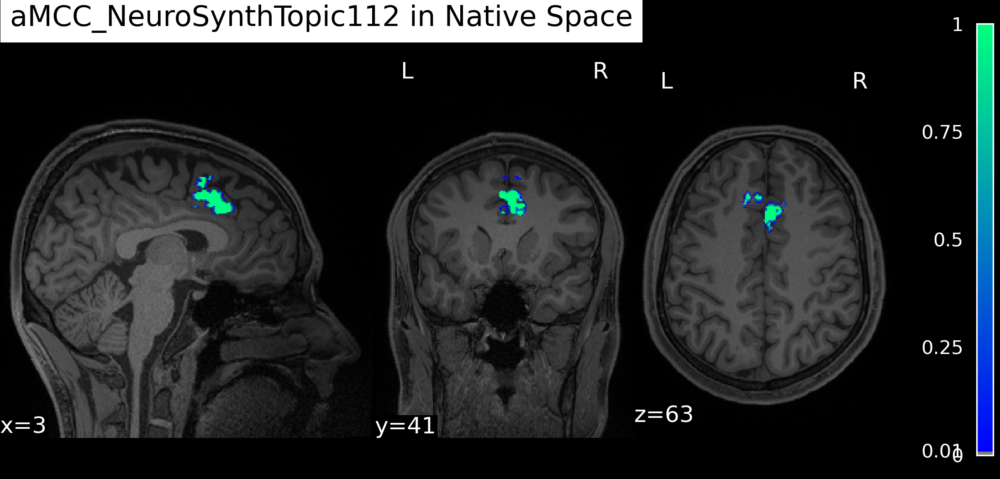

Reg QC figure: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/figures/sub-z004_MNI2native_regcheck.png


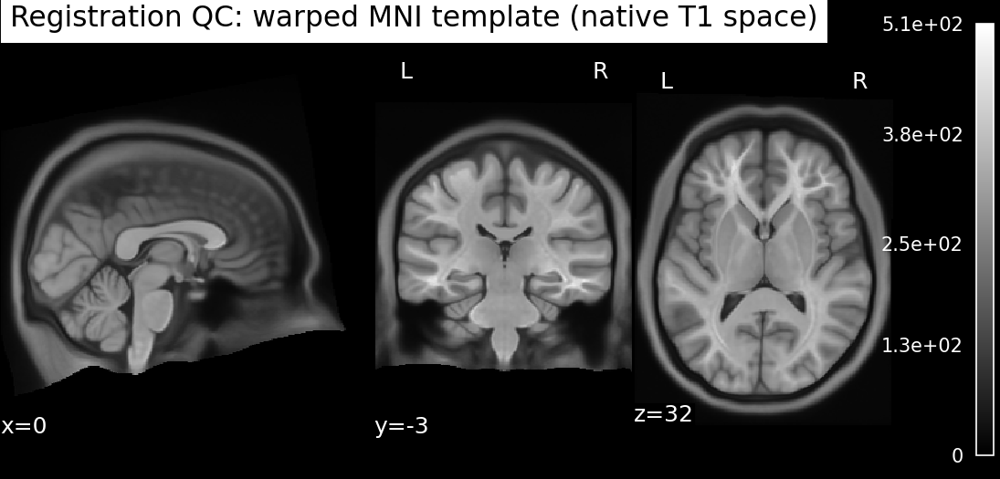

Reg QC axial: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/figures/sub-z004_MNI2native_regcheck_axial.png


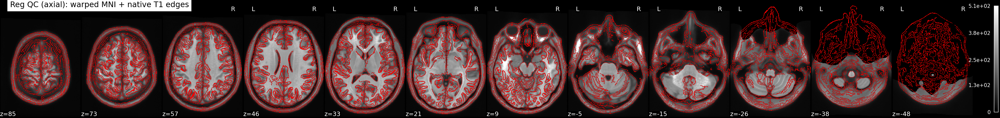

Reg QC coronal: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSPractice/SUB_LIST_UMD/sub-z004/figures/sub-z004_MNI2native_regcheck_coronal.png


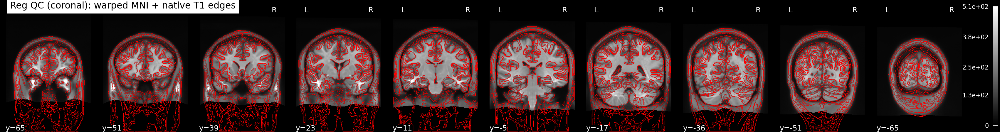

/Users/atsushikikumoto/miniforge3/envs/mri/lib/python3.11/site-packages/numpy/_core/fromnumeric.py:820: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



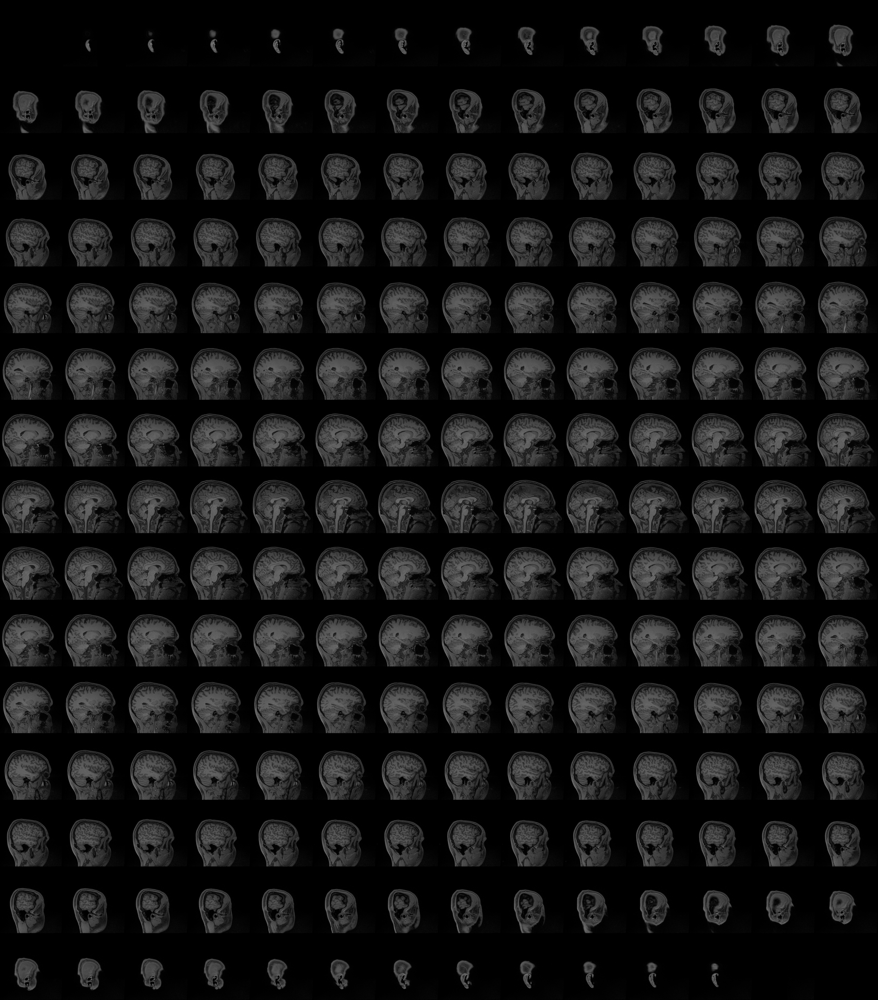
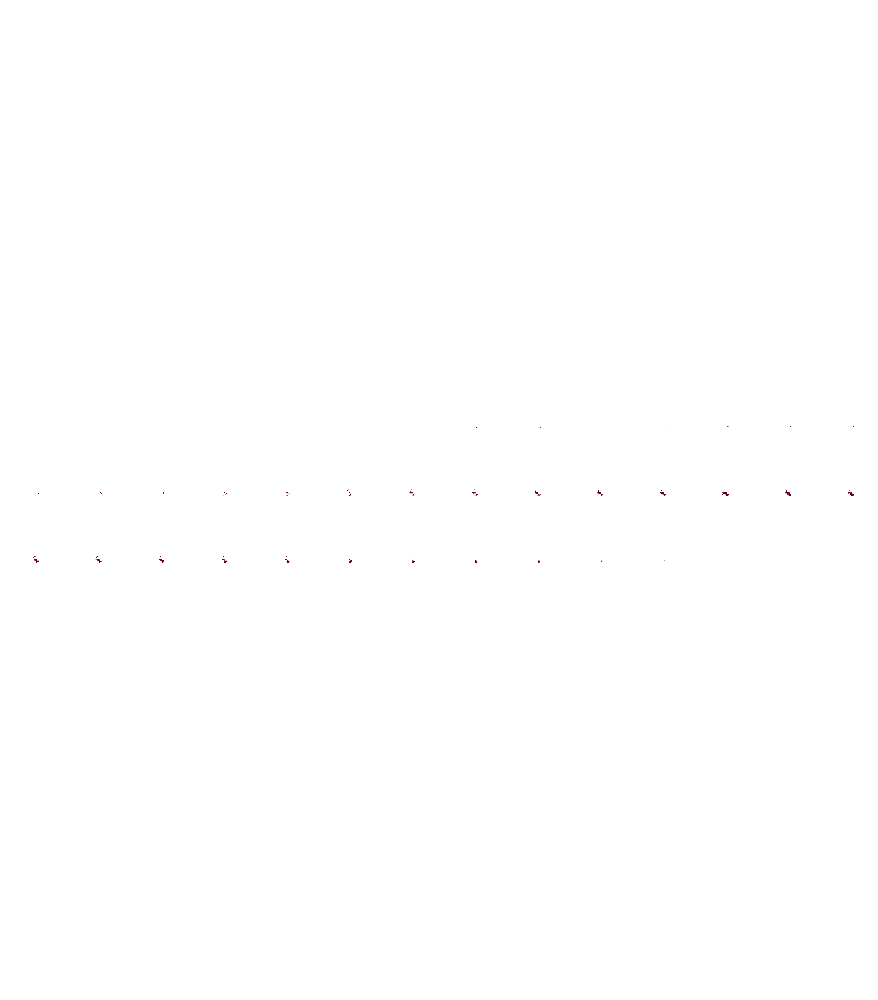

In [21]:

# -----------------------------------------------------------------------
# Step 3d — Visualise mask overlay on native T1
# -----------------------------------------------------------------------
#
# Produces:
#   1. Tri-planar mask overlay on native T1 → saved as PNG
#   2. Registration QC figure — tri-planar warped MNI template (ANTs mode only)
#   2b. Registration QC mosaic — many axial slices with native T1 edge overlay
#       (warped MNI background + native T1 edges; misalignment shows as edge gaps)
#   3. Functional map overlay (if FUNC_MAP_FILE is set)
#   4. Combined (union) mask overlay (if ROI_UNION_FILE is set)
#   5. Interactive viewer — bilateral mask (+ L/R if LR_SPLIT=True)

# figures/registration/ — see fig_dir_for() in src/utils.py, shared
# with run_reg.py so the batch and the notebook file QC the same way.
_fig_dir = fig_dir_for(sub_dir)

# 1. Mask overlay
fig_path = _fig_dir / f"{sub_id_full}_{MASK_LABEL}_native_overlay.png"
fig = visualize_mask_native(
    mask_native=mask_native,
    t1_native=t1_native_orig,
    target_label=MASK_LABEL,
    output_path=fig_path,
    z_threshold=Z_THRESHOLD,
)
display(IPImage(filename=str(fig_path)))

# 2. Registration QC — tri-planar (ANTs mode only)
# Show the warped MNI template alone via plot_anat (no bg_img).
# The warped image should look like a proper T1 brain — verify visually.
# Note: plot_anat with both anat_img and bg_img overlays anat_img as a
# stat_map (with colourbar), which is wrong for registration QC.
if REGISTRATION_MODE == "ants" and reg is not None:
    reg_fig_path = _fig_dir / f"{sub_id_full}_MNI2native_regcheck.png"
    reg_fig = plotting.plot_anat(
        ants_to_nib(reg["warpedmovout"]),
        display_mode="ortho",
        draw_cross=False,
        title="Registration QC: warped MNI template (native T1 space)",
        dim=-0.5,
    )
    reg_fig.savefig(str(reg_fig_path), dpi=150)
    plt.close("all")
    print(f"Reg QC figure: {reg_fig_path}")
    display(IPImage(filename=str(reg_fig_path)))

    # 2b. Registration QC mosaic — many slices + native T1 edge overlay
    # Warped MNI is the background; native T1 edges are drawn on top.
    # Good registration → edges align with brain boundaries in the warped MNI.
    # Bad registration → visible gap between background brain and edge contours.
    reg_mosaic_path = _fig_dir / f"{sub_id_full}_MNI2native_regcheck_mosaic.png"
    for _display_mode, _n_cuts, _suffix in [("z", 12, "axial"), ("y", 10, "coronal")]:
        _path = _fig_dir / f"{sub_id_full}_MNI2native_regcheck_{_suffix}.png"
        _mosaic = plotting.plot_anat(
            ants_to_nib(reg["warpedmovout"]),
            display_mode=_display_mode,
            cut_coords=_n_cuts,
            draw_cross=False,
            dim=-0.5,
            title=f"Reg QC ({_suffix}): warped MNI + native T1 edges",
        )
        _mosaic.add_edges(ants_to_nib(t1_native_ras))
        _mosaic.savefig(str(_path), dpi=150)
        plt.close("all")
        print(f"Reg QC {_suffix}: {_path}")
        display(IPImage(filename=str(_path)))

else:
    print("fmriprep mode: registration QC figure skipped (no warpedmovout).")

# 3. Functional map overlay (if present)
if func_native is not None:
    func_fig_path = _fig_dir / f"{sub_id_full}_{FUNC_MAP_LABEL}_native_overlay.png"
    func_fig = plotting.plot_stat_map(
        stat_map_img=ants_to_nib(func_native),
        bg_img=ants_to_nib(t1_native_orig),
        threshold=Z_THRESHOLD,
        display_mode="ortho",
        draw_cross=False,
        cmap="hot",
        title=f"{FUNC_MAP_LABEL} in Native Space",
    )
    func_fig.savefig(str(func_fig_path), dpi=150)
    plt.close("all")
    display(IPImage(filename=str(func_fig_path)))

# 4. Combined (union) mask overlay (if ROI_UNION_FILE is set)
if combined_native is not None:
    union_label    = f"{MASK_LABEL}_union_{ROI_UNION_LABEL}"
    union_fig_path = _fig_dir / f"{sub_id_full}_{union_label}_native_overlay.png"
    union_fig = visualize_mask_native(
        mask_native=combined_native,
        t1_native=t1_native_orig,
        target_label=union_label,
        output_path=union_fig_path,
        z_threshold=0.5,          # combined mask is binary (0 / 1)
        cmap="autumn",
    )
    display(IPImage(filename=str(union_fig_path)))

# 5. Interactive viewer — bilateral mask
_nib_t1 = ants_to_nib(t1_native_orig)
display(plotting.view_img(
    ants_to_nib(mask_native),
    bg_img=_nib_t1,
    opacity=0.6,
    radiological=False,
    resampling_interpolation="nearest",
    title=f"{MASK_LABEL} — {sub_id_full} (native, bilateral)",
))


In [22]:
# -----------------------------------------------------------------------
# Step 3e — Compute target coordinate in native-space mm
# -----------------------------------------------------------------------
#
# TARGET_MODE controls which coordinate is reported:
#   "CoM"       — centre of mass of thresholded native mask
#   "peak_func" — peak voxel of functional map within native mask
#   "skip"      — no coordinate computation
#
# If ROI_UNION_FILE is set, the combined (union) mask is used for targeting
# instead of MASK_FILE alone.
# If LR_SPLIT=True, CoM and peak_func are reported per hemisphere; L and R
# are written as two rows in a single combined BrainSight file.
# Hemispheres with 0 voxels (e.g. a left-only mask) are skipped silently.

def _report_coord(mm, vox, *, mode, mask_lbl, sub_id, coord_tag, extra_lines=()):
    """Print a formatted coordinate summary block."""
    print(f"\n{'='*52}")
    print(f"  Target mode:       {mode}")
    for line in extra_lines:
        print(line)
    print(f"  Mask:              {mask_lbl}")
    print(f"  Subject:           {sub_id}")
    print(f"  {coord_tag} (native, mm): x={mm[0]:.2f}  y={mm[1]:.2f}  z={mm[2]:.2f}")
    print(f"  {coord_tag} (voxel):      i={vox[0]:.1f}  j={vox[1]:.1f}  k={vox[2]:.1f}")
    print(f"{'='*52}")

# ── Select active mask for targeting ─────────────────────────────────────────
_use_union    = ROI_UNION_FILE and combined_native is not None
_target_mask  = combined_native if _use_union else mask_native
_target_label = f"{MASK_LABEL}∪{ROI_UNION_LABEL}" if _use_union else MASK_LABEL
_target_z_thr = 0.5 if _use_union else Z_THRESHOLD   # combined mask is binary (0/1)

if _use_union:
    print(f"Using combined (union) mask for targeting: {_target_label}")

# ── Compute target coordinate ─────────────────────────────────────────────────
if TARGET_MODE == "skip":
    print("TARGET_MODE='skip' — coordinate computation skipped.")

elif TARGET_MODE == "CoM":
    com_mm, com_vox = compute_com_native(_target_mask, z_threshold=_target_z_thr)
    _report_coord(com_mm, com_vox,
                  mode="CoM (centre of mass)", coord_tag="CoM",
                  mask_lbl=_target_label, sub_id=sub_id_full)

    _coord_path = sub_dir / f"{sub_id_full}_{MASK_LABEL}_CoM_target.txt"

    if LR_SPLIT and mask_native_L is not None:
        # ── Per-hemisphere CoM — skip empty hemispheres ───────────────────────
        _hemi_entries = []
        for _side, _hemi_mask in (("_L", mask_native_L), ("_R", mask_native_R)):
            if int((_hemi_mask.numpy() > Z_THRESHOLD).sum()) == 0:
                print(f"  {_side.strip('_')} hemisphere: 0 voxels — skipped")
                continue
            _c_mm, _c_vox = compute_com_native(_hemi_mask, z_threshold=Z_THRESHOLD)
            _hemi_entries.append((_side, _c_mm, _c_vox))

        for _i, (_side, _c_mm, _c_vox) in enumerate(_hemi_entries):
            _report_coord(_c_mm, _c_vox,
                          mode=f"CoM ({_side.strip('_')} hemisphere)", coord_tag="CoM",
                          mask_lbl=f"{_target_label}{_side}", sub_id=sub_id_full)
            write_brainsight_com(
                com_mm=_c_mm,
                label=f"{sub_id_full}_{MASK_LABEL}{_side}",
                out_path=_coord_path,
                coordinate_system=COORDINATE_SYSTEM,
                append=(_i > 0),
            )
    else:
        # ── Single bilateral entry ─────────────────────────────────────────────
        write_brainsight_com(
            com_mm=com_mm,
            label=f"{sub_id_full}_{MASK_LABEL}",
            out_path=_coord_path,
            coordinate_system=COORDINATE_SYSTEM,
        )
    print(f"  Saved: {_coord_path.name}")

elif TARGET_MODE == "peak_func":
    if func_native is None:
        raise RuntimeError(
            "TARGET_MODE='peak_func' requires FUNC_MAP_FILE to be set "
            "and processed in step 3c."
        )
    peak_mm, peak_vox, peak_val = compute_peak_native(
        func_native=func_native,
        mask_native=_target_mask,
        z_threshold=_target_z_thr,
    )
    _report_coord(peak_mm, peak_vox,
                  mode="Peak (functional map)", coord_tag="Peak",
                  mask_lbl=_target_label, sub_id=sub_id_full,
                  extra_lines=[
                      f"  Functional map:    {FUNC_MAP_LABEL}",
                      f"  Peak value:        {peak_val:.3f}",
                  ])

    # ── Save peak coordinate as BrainSight target file ────────────────────────
    _coord_path = sub_dir / f"{sub_id_full}_{MASK_LABEL}_{FUNC_MAP_LABEL}_peak_target.txt"

    if LR_SPLIT and mask_native_L is not None:
        # ── Per-hemisphere peak — skip empty hemispheres ──────────────────────
        _hemi_entries = []
        for _side, _hemi_mask in (("_L", mask_native_L), ("_R", mask_native_R)):
            if int((_hemi_mask.numpy() > Z_THRESHOLD).sum()) == 0:
                print(f"  {_side.strip('_')} hemisphere: 0 voxels — skipped")
                continue
            _p_mm, _p_vox, _p_val = compute_peak_native(
                func_native=func_native, mask_native=_hemi_mask, z_threshold=Z_THRESHOLD)
            _hemi_entries.append((_side, _p_mm, _p_vox, _p_val))

        for _i, (_side, _p_mm, _p_vox, _p_val) in enumerate(_hemi_entries):
            _report_coord(_p_mm, _p_vox,
                          mode=f"Peak ({_side.strip('_')} hemisphere)", coord_tag="Peak",
                          mask_lbl=f"{_target_label}{_side}", sub_id=sub_id_full,
                          extra_lines=[
                              f"  Functional map:    {FUNC_MAP_LABEL}",
                              f"  Peak value:        {_p_val:.3f}",
                          ])
            write_brainsight_com(
                com_mm=_p_mm,
                label=f"{sub_id_full}_{MASK_LABEL}_{FUNC_MAP_LABEL}{_side}_peak",
                out_path=_coord_path,
                coordinate_system=COORDINATE_SYSTEM,
                append=(_i > 0),
            )
    else:
        # ── Single bilateral entry ─────────────────────────────────────────────
        write_brainsight_com(
            com_mm=peak_mm,
            label=f"{sub_id_full}_{MASK_LABEL}_{FUNC_MAP_LABEL}_peak",
            out_path=_coord_path,
            coordinate_system=COORDINATE_SYSTEM,
        )
    print(f"  Saved: {_coord_path.name}")

else:
    raise ValueError(f"Unknown TARGET_MODE: {TARGET_MODE!r}")

CoM (native, mm): [ 3.51106762 41.5371504  63.91246671]
CoM (voxel):      (np.float64(109.20359666024406), np.float64(172.41532862342112), np.float64(191.41811175337187))

  Target mode:       CoM (centre of mass)
  Mask:              aMCC_NeuroSynthTopic112
  Subject:           sub-z004
  CoM (native, mm): x=3.51  y=41.54  z=63.91
  CoM (voxel):      i=109.2  j=172.4  k=191.4
CoM (native, mm): [-2.55440389 41.73561414 65.70375493]
CoM (voxel):      (np.float64(101.62039660056658), np.float64(172.61756373937678), np.float64(193.657223796034))
CoM (native, mm): [ 5.4175892  41.49978143 63.29961849]
CoM (voxel):      (np.float64(111.58698727015559), np.float64(172.38302687411598), np.float64(190.65205091937764))

  Target mode:       CoM (L hemisphere)
  Mask:              aMCC_NeuroSynthTopic112_L
  Subject:           sub-z004
  CoM (native, mm): x=-2.55  y=41.74  z=65.70
  CoM (voxel):      i=101.6  j=172.6  k=193.7
  BrainSight CoM file: /Users/atsushikikumoto/Dropbox/w_SCRIPTS/P.TUSP